In [152]:
# visualization
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
fe = fm.FontEntry(
    fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
    name='NanumBarunGothic')                        # 이 폰트의 원하는 이름 설정
fm.fontManager.ttflist.insert(0, fe)              # Matplotlib에 폰트 추가
plt.rcParams.update({'font.size': 10, 'font.family': 'NanumBarunGothic'}) # 폰트 설정
plt.rc('font', family='NanumBarunGothic')
import seaborn as sns

# utils
import pandas as pd
import numpy as np
from tqdm import tqdm
import pickle
import warnings;warnings.filterwarnings('ignore')

In [19]:
# 필요한 데이터를 load 하겠습니다. 경로는 환경에 맞게 지정해주면 됩니다.
train_path = '/data/ephemeral/home/Upstage_ML_Competition01/data/train.csv'
test_path  = '/data/ephemeral/home/Upstage_ML_Competition01/data/test.csv'
codebook_path = '/data/ephemeral/home/Upstage_ML_Competition01/data/codebook.csv' # 코드북의 경로
train = pd.read_csv(train_path)
test = pd.read_csv(test_path)
codebook = pd.read_csv(codebook_path) # 코드북 경로를 통해 코드북을 불러옴

In [8]:
# train/test 구분을 위한 칼럼을 하나 만들어 줍니다.
train['is_test'] = 0
test['is_test'] = 1
concat = pd.concat([train, test])     # 하나의 데이터로 만들어줍니다.

In [6]:
concat['계약년'] = concat['계약년월'].astype('str').map(lambda x : x[:4])
concat['계약월'] = concat['계약년월'].astype('str').map(lambda x : x[4:])

NameError: name 'concat' is not defined

In [107]:
concat['구'] = concat['시군구'].map(lambda x : x.split()[1])
concat['동'] = concat['시군구'].map(lambda x : x.split()[2])

In [108]:
visual = concat
visual["계약년월일"] = visual["계약년월"].astype(str)+visual["계약일"].astype(str)
visual["계약년월일"] = pd.to_datetime(visual["계약년월일"], format='%Y%m%d')

In [109]:
visual["계약년월"] = visual["계약년"].astype(str) + "-" + visual["계약월"].astype(str).str.zfill(2)

In [110]:
visual = visual.sort_values(by="계약년월일")

In [111]:
visual

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,좌표X,좌표Y,단지신청일,target,is_test,계약년,계약월,구,동,계약년월일
1079272,서울특별시 강동구 길동,45,45.0,0.0,우림루미아트,84.5700,2007-01,1,7,2003,...,NaN,NaN,NaN,28000.0,0,2007,01,강동구,길동,2007-01-01
1094076,서울특별시 노원구 중계동,445,445.0,0.0,염광,59.3400,2007-01,1,8,1996,...,NaN,NaN,NaN,22000.0,0,2007,01,노원구,중계동,2007-01-01
1103737,서울특별시 서대문구 북가좌동,325-18,325.0,18.0,충우팰리스1,84.8800,2007-01,1,3,2004,...,NaN,NaN,NaN,24000.0,0,2007,01,서대문구,북가좌동,2007-01-01
1109028,서울특별시 성북구 하월곡동,225,225.0,0.0,래미안월곡,114.6780,2007-01,1,18,2006,...,NaN,NaN,NaN,70000.0,0,2007,01,성북구,하월곡동,2007-01-01
1101807,서울특별시 동작구 신대방동,395-62,395.0,62.0,삼성보라매옴니타워,164.7600,2007-01,1,15,1997,...,NaN,NaN,NaN,77000.0,0,2007,01,동작구,신대방동,2007-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5378,서울특별시 서대문구 연희동,746,746.0,0.0,연희웨스트팰리스,13.1200,2023-09,25,6,2014,...,NaN,NaN,NaN,NaN,1,2023,09,서대문구,연희동,2023-09-25
3794,서울특별시 도봉구 방학동,705-17,705.0,17.0,퍼스티안,13.6794,2023-09,25,12,2013,...,NaN,NaN,NaN,NaN,1,2023,09,도봉구,방학동,2023-09-25
8102,서울특별시 영등포구 문래동3가,93-1,93.0,1.0,문래건영,59.4000,2023-09,25,11,1998,...,NaN,NaN,NaN,NaN,1,2023,09,영등포구,문래동3가,2023-09-25
5834,서울특별시 서초구 서초동,1330,1330.0,0.0,서초동삼성쉐르빌2,35.1700,2023-09,26,7,2002,...,NaN,NaN,NaN,NaN,1,2023,09,서초구,서초동,2023-09-26


In [119]:
gu_list = visual["구"].unique()
gu_list

array(['강동구', '노원구', '서대문구', '성북구', '동작구', '서초구', '도봉구', '동대문구', '강서구',
       '중랑구', '은평구', '영등포구', '금천구', '중구', '구로구', '관악구', '마포구', '용산구',
       '양천구', '성동구', '강북구', '광진구', '강남구', '종로구', '송파구'], dtype=object)

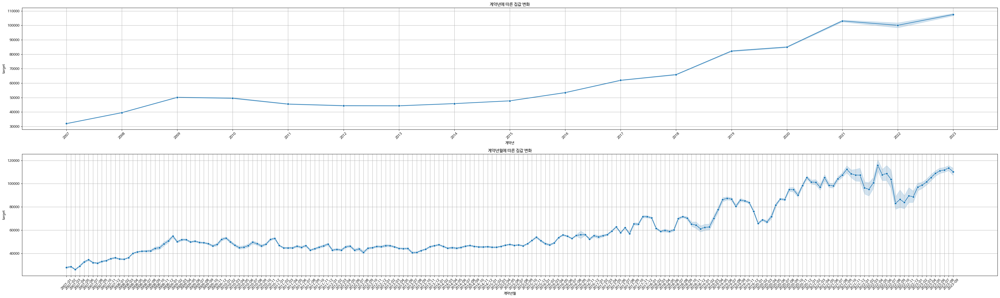

In [100]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(40, 12))
ax1.set_title("계약년에 따른 집값 변화")
ax1.grid(True)
sns.lineplot(data=visual, x="계약년", y= "target", marker='o', ax=ax1)
ax1.set_xticklabels(labels=visual["계약년"].unique(), rotation=45)
ax2.set_title("계약년월에 따른 집값 변화")
ax2.grid(True)
sns.lineplot(data=visual, x="계약년월", y= "target", marker='o', ax=ax2)
ax2.set_xticklabels(labels=visual["계약년월"].unique(), rotation=45)

plt.tight_layout()
plt.show()

In [5]:
train[train["계약년"] >= 2017]

KeyError: '계약년'

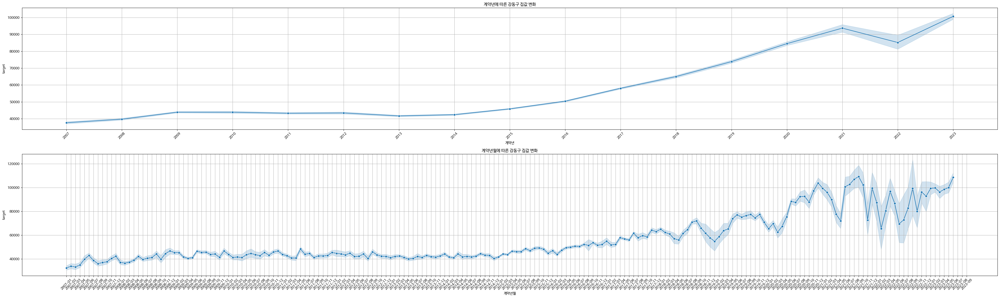

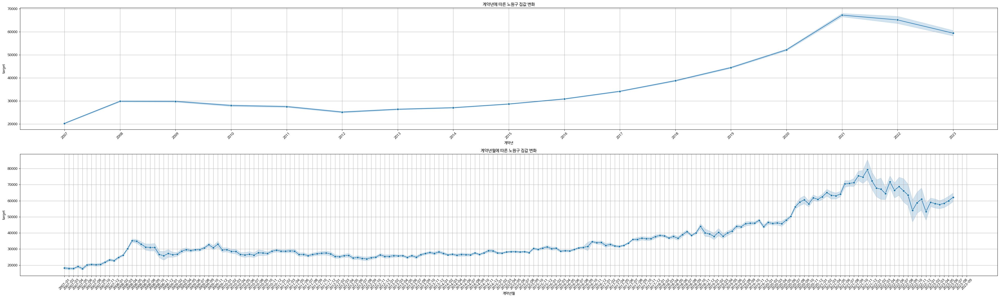

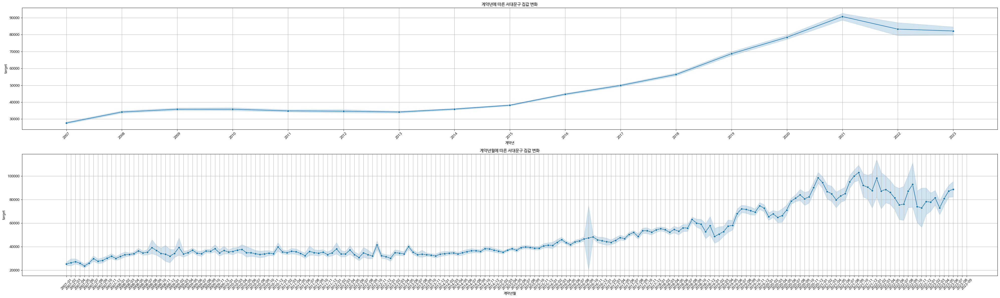

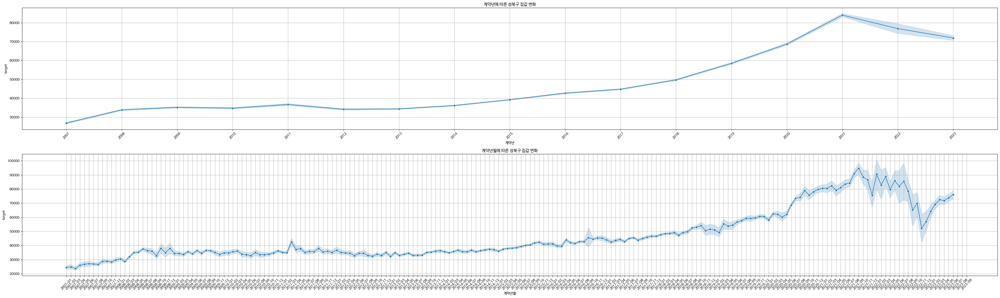

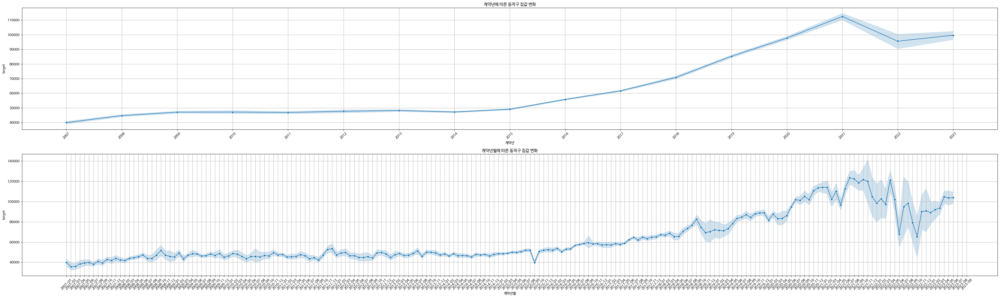

...

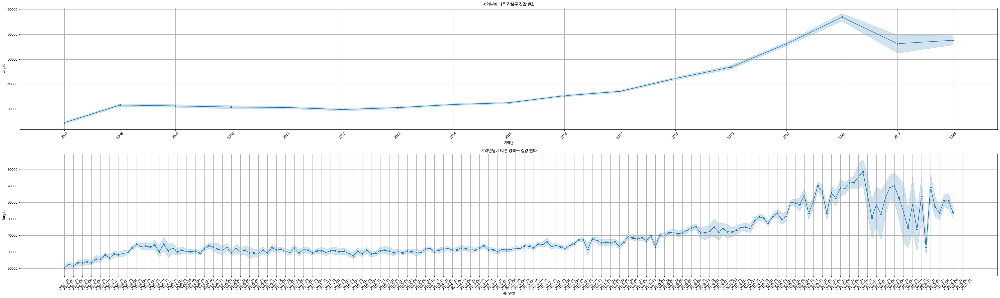

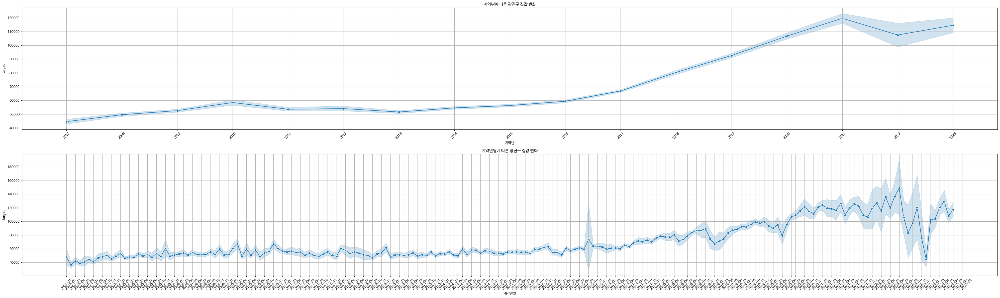

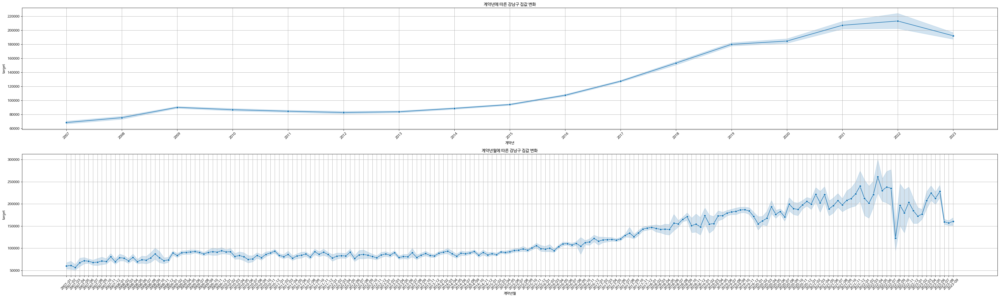

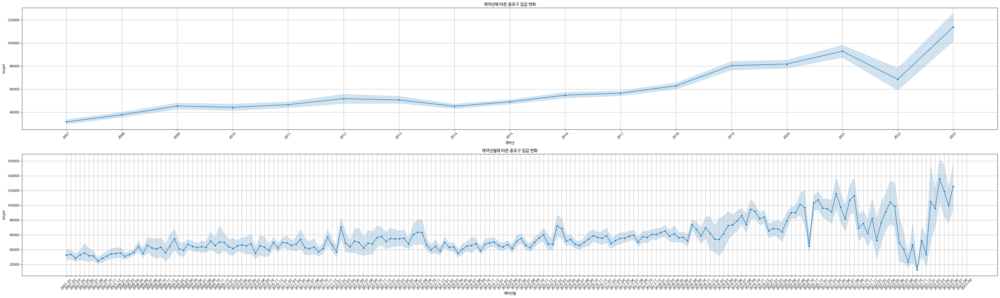

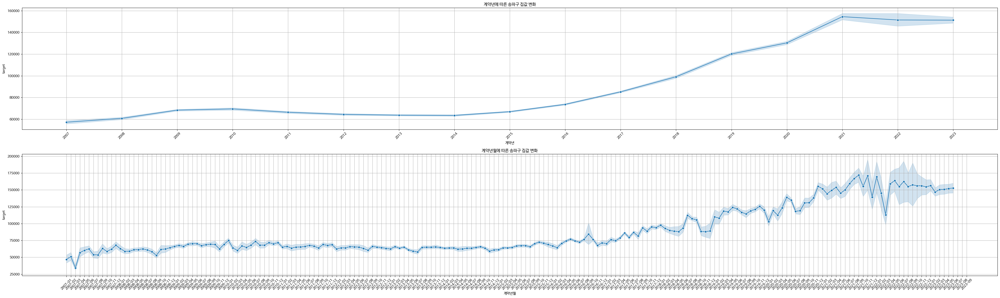

In [116]:
for gu in gu_list:
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(40, 12))
    ax1.set_title(f"계약년에 따른 {gu} 집값 변화")
    ax1.grid(True)
    sns.lineplot(data=visual[visual["구"]==gu], x="계약년", y= "target", marker='o', ax=ax1)
    ax1.set_xticklabels(labels=visual["계약년"].unique(), rotation=45)
    ax2.set_title(f"계약년월에 따른 {gu} 집값 변화")
    ax2.grid(True)
    sns.lineplot(data=visual[visual["구"]==gu], x="계약년월", y= "target", marker='o', ax=ax2)
    ax2.set_xticklabels(labels=visual["계약년월"].unique(), rotation=45)
    plt.tight_layout()
    plt.show()

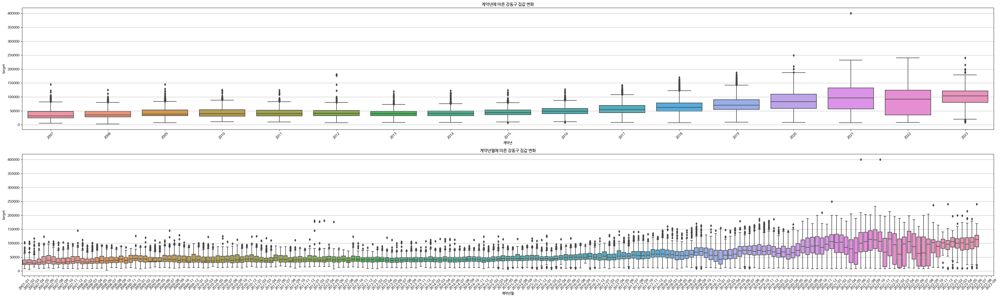

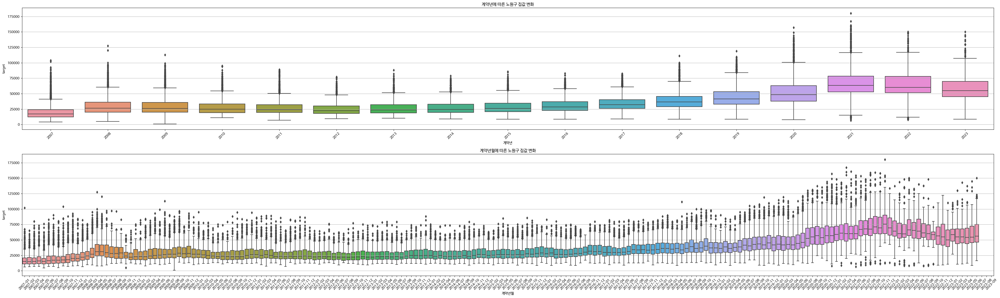

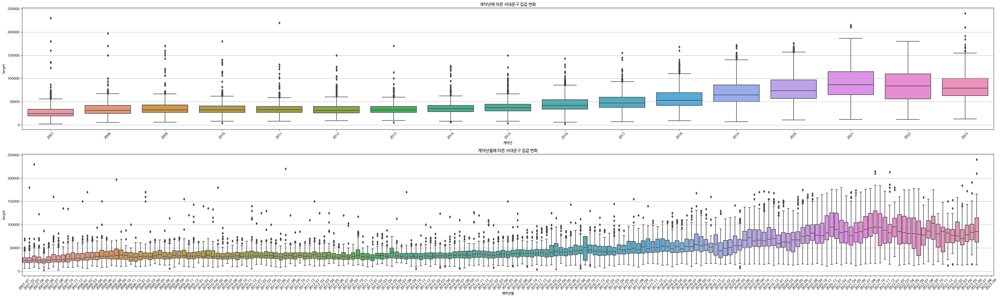

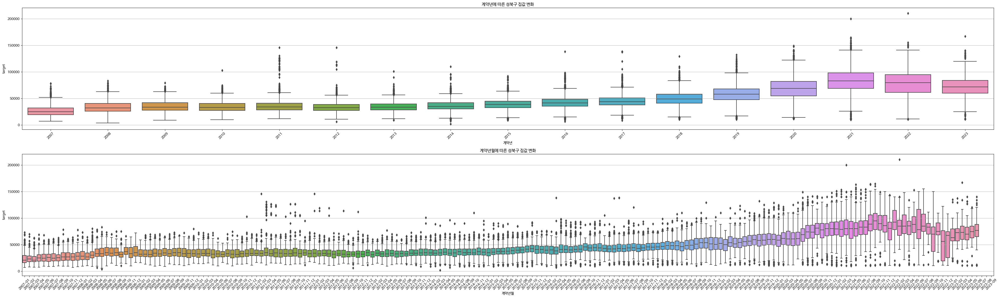

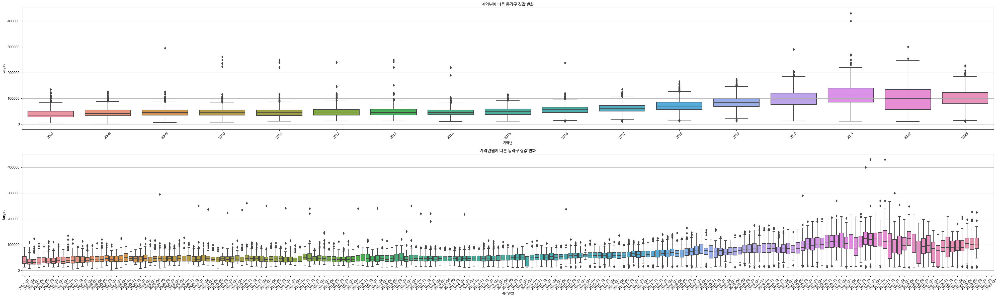

...

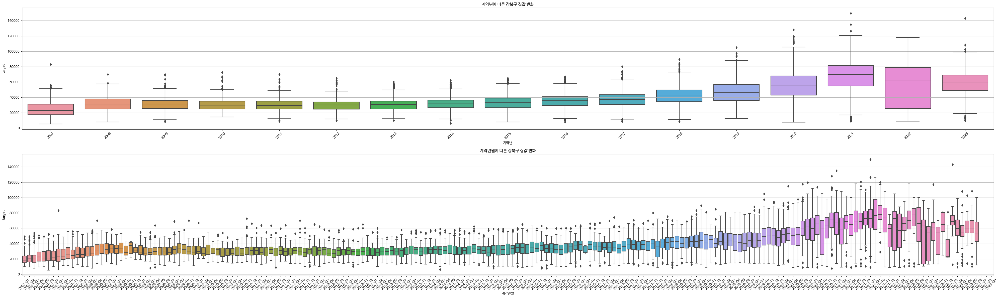

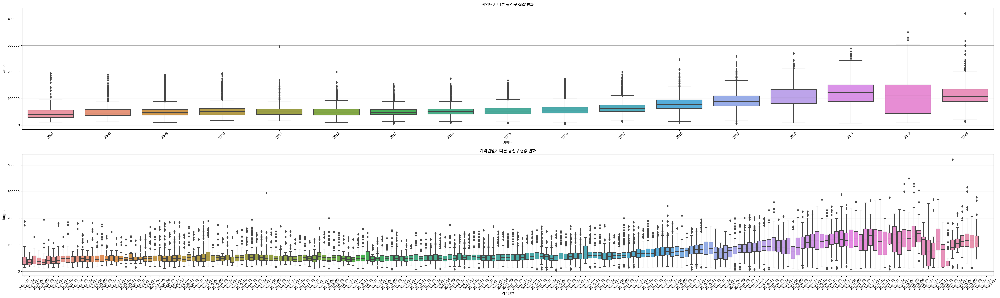

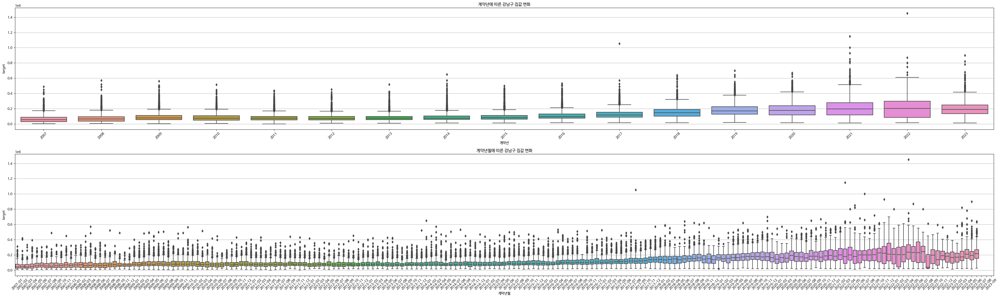

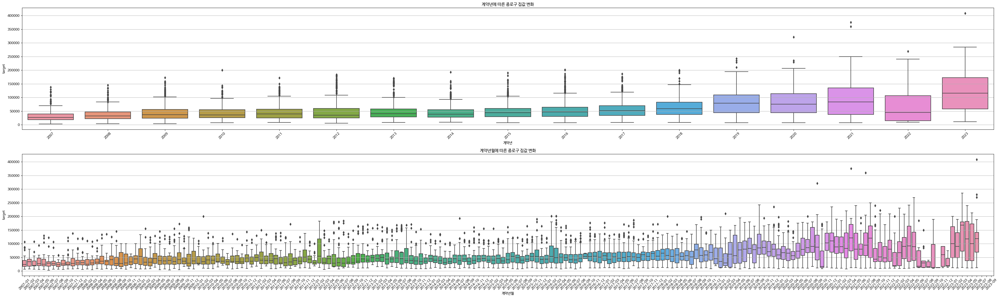

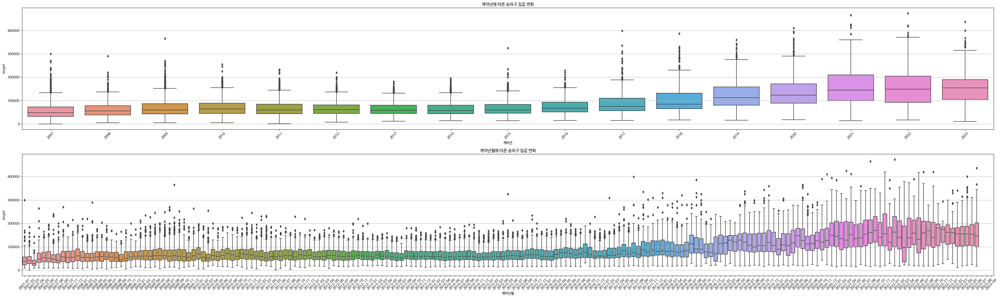

In [121]:
for gu in gu_list:
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(40, 12))
    ax1.set_title(f"계약년에 따른 {gu} 집값 변화")
    ax1.grid(True)
    sns.boxplot(data=visual[visual["구"]==gu], x="계약년", y= "target", ax=ax1)
    ax1.set_xticklabels(labels=visual["계약년"].unique(), rotation=45)
    ax2.set_title(f"계약년월에 따른 {gu} 집값 변화")
    ax2.grid(True)
    sns.boxplot(data=visual[visual["구"]==gu], x="계약년월", y= "target", ax=ax2)
    ax2.set_xticklabels(labels=visual["계약년월"].unique(), rotation=45)
    plt.tight_layout()
    plt.show()

## Plotly

계약년별로 (2017~) Target 확인

In [223]:
import plotly.express as px
import plotly.colors as colors
import plotly.graph_objects as go

train_path = '/data/ephemeral/home/Upstage_ML_Competition01/data/train.csv'
train = pd.read_csv(train_path)

In [224]:
train['계약년'] = train['계약년월'].astype('str').map(lambda x : x[:4]).astype(int)
train['계약월'] = train['계약년월'].astype('str').map(lambda x : x[4:]).astype(int)
train['구'] = train['시군구'].map(lambda x : x.split()[1])
train['동'] = train['시군구'].map(lambda x : x.split()[2])

In [225]:
train

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target,계약년,계약월,구,동
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,...,Y,N,127.057210,37.476763,2022-11-17 10:19:06.0,124000,2017,12,강남구,개포동
1,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,22,4,1987,...,Y,N,127.057210,37.476763,2022-11-17 10:19:06.0,123500,2017,12,강남구,개포동
2,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,54.98,201712,28,5,1987,...,Y,N,127.057210,37.476763,2022-11-17 10:19:06.0,91500,2017,12,강남구,개포동
3,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201801,3,4,1987,...,Y,N,127.057210,37.476763,2022-11-17 10:19:06.0,130000,2018,1,강남구,개포동
4,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201801,8,2,1987,...,Y,N,127.057210,37.476763,2022-11-17 10:19:06.0,117000,2018,1,강남구,개포동
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1118817,서울특별시 은평구 구산동,382,382.0,0.0,갈현현대,59.94,200707,12,11,1998,...,Y,N,126.905638,37.612962,2013-03-07 09:46:27.0,20000,2007,7,은평구,구산동
1118818,서울특별시 은평구 구산동,382,382.0,0.0,갈현현대,59.94,200708,25,10,1998,...,Y,N,126.905638,37.612962,2013-03-07 09:46:27.0,20000,2007,8,은평구,구산동
1118819,서울특별시 은평구 구산동,382,382.0,0.0,갈현현대,84.83,200708,31,20,1998,...,Y,N,126.905638,37.612962,2013-03-07 09:46:27.0,28000,2007,8,은평구,구산동
1118820,서울특별시 은평구 구산동,382,382.0,0.0,갈현현대,84.83,200709,15,8,1998,...,Y,N,126.905638,37.612962,2013-03-07 09:46:27.0,29000,2007,9,은평구,구산동


In [226]:
use_train = train[["구", "계약년", "계약년월", "target"]]

In [227]:
pd.merge(use_train, use_train.groupby(by=["구", "계약년"])["target"].mean(), on=["구", "계약년"], how="inner",)

,구,계약년,계약년월,target_x,target_y
0,강남구,2017,201712,124000,127433.787900
1,강남구,2017,201712,123500,127433.787900
2,강남구,2017,201712,91500,127433.787900
3,강남구,2017,201710,152000,127433.787900
4,강남구,2017,201711,182000,127433.787900
...,...,...,...,...,...
1118817,중랑구,2007,200709,17000,21566.125949
1118818,중랑구,2007,200704,21000,21566.125949
1118819,중랑구,2007,200704,27000,21566.125949
1118820,중랑구,2007,200705,24200,21566.125949


In [ ]:
train_stat = use_train[["구", "계약년", "계약년월"]]